## 📜 Welcome Back, Visioneer
Having successfully passed through **Gate 1: The Chamber of Singular Truths**, you have proven your mastery of decomposition and reconstruction. The Grand Archivist nods approvingly:

"Well done, apprentice. You have learned to see the essential from the chaotic. Now you face Gate 2, where you must combine purification, detection, and recognition to unlock ancient secrets."

But the Archivist's warning echoes still:
"Beware. Those who attempt to pass with borrowed visions or false answers are cursed. Only true effort and understanding unlock the path forward."

## 🌀 Gate 2: Mosaic of Whispers
Theme: Image Denoising, Harris Corner Detection, Feature Matching

In the Gallery of Fragmented Memories, you find a beautiful Byzantine mosaic showing portraits of an ancient philosopher. As you admire it, Professor Dhoom Ketu steps out from the shadows, his wild hair floating and eyes full of mischief.

“Ah! The Mosaic of the Hidden Philosopher!” he says with a grin, handing you the preserved portrait. “This is your reference key.”

Suddenly, the Curse of Temporal Decay strikes—the rest of the mosaic is corrupted with noise and distortions. Professor Ketu sighs, “The curse again! Luckily, I saved the original before it was damaged. Now you can use this for your assignment.”

Run the following code to set things up:



# Assignment setup

In [ ]:
## Importing recipes
%matplotlib inline

import imageio
import numpy as np
import os
import cv2
import matplotlib.pyplot as plt
from google.colab import drive
from skimage.color import rgb2gray
# Mounting google drive
drive.mount('/content/drive')


import matplotlib.pyplot as plt

def display_images_in_row(images, labels=None, cmap=None):
    """
    Display multiple images in a single row with labels below them.

    Args:
        images (list): List of images (numpy arrays or tensors convertible to numpy).
        labels (list, optional): List of labels corresponding to each image.
        cmap (str, optional): Colormap for displaying grayscale images.
    """
    num_images = len(images)
    print(f"Displaying {num_images} image{'s' if num_images > 1 else ''}")

    fig, axs = plt.subplots(1, num_images, figsize=(4 * num_images, 4))

    # Ensure axs is iterable
    if num_images == 1:
        axs = [axs]

    for i, (ax, img) in enumerate(zip(axs, images)):
        # Choose colormap
        if cmap is None:
            if img.ndim == 2 or (img.ndim == 3 and img.shape[2] == 1):
                ax.imshow(img.squeeze(), cmap="gray")
            else:
                ax.imshow(img)
        else:
            ax.imshow(img, cmap=cmap)

        ax.axis("off")

        # Add label below image if available
        if labels is not None and i < len(labels):
            ax.set_title(labels[i], fontsize=12, fontweight="bold", pad=10)

    plt.tight_layout()
    plt.show()


# Resize the original image to a smaller size
def resize_image(img, max_size=200):
    """Resize image while maintaining aspect ratio"""
    h, w = img.shape[:2]
    if max(h, w) > max_size:
        scale = max_size / max(h, w)
        new_h, new_w = int(h * scale), int(w * scale)
        resized = cv2.resize(img, (new_w, new_h), interpolation=cv2.INTER_AREA)
        return resized
    return img


## Making recipes
base_path = "/content/drive/My Drive/ES666CV/images/B/"
mosaic_path = os.path.join(base_path, "mosaic.jpg")
key_path = os.path.join(base_path, "key.jpg")

# Load images
mosaic = cv2.imread(mosaic_path)        # BGR format
key = cv2.imread(key_path)

# Convert to RGB for matplotlib display
mosaic_rgb = cv2.cvtColor(mosaic, cv2.COLOR_BGR2RGB)
key_rgb = cv2.cvtColor(key, cv2.COLOR_BGR2RGB)

# Also convert to grayscale (float [0,1]) if needed for processing
mosaic_gray = rgb2gray(mosaic_rgb)
key_gray = rgb2gray(key_rgb)
mosaic_rgb_rs = resize_image(mosaic_rgb, max_size=500)
mosaic_rgb_rs = mosaic_rgb_rs.astype(np.float32) / 255.0

Mounted at /content/drive


# Mosaic and Key

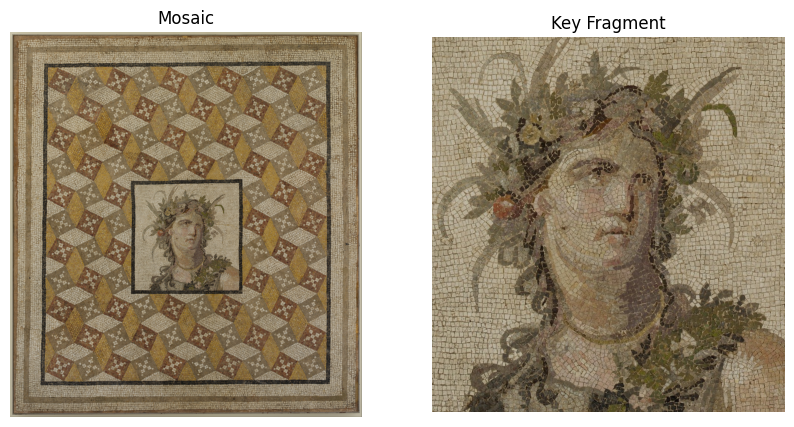

In [ ]:
fig, axs = plt.subplots(1, 2, figsize=(10, 5))
axs[0].imshow(mosaic_rgb)
axs[0].set_title("Mosaic")
axs[0].axis("off")
axs[1].imshow(key_rgb)
axs[1].set_title("Key Fragment")
axs[1].axis("off")
plt.show()

### Task 1: Master the Arts of Purification (4 Marks)
Professor Ketu: "First, we must counteract the curse using the four sacred filtering techniques."

Implement the four denoising methods (mean, median, bilateral and gaussian) and compare their effectiveness:

In [ ]:
# run this cell as it is

def add_gaussian_noise(img, mean=0, var=0.01):
    if img.dtype != np.float32:
        img = img.astype(np.float32) / 255.0

    sigma = var**0.5
    noise = np.random.normal(mean, sigma, img.shape).astype(np.float32)
    noisy_img = np.clip(img + noise, 0.0, 1.0)

    return noisy_img


def add_salt_pepper_noise(img, amount=0.05):

    noisy_img = img.copy()
    H, W, _ = noisy_img.shape

    num_noisy_pixels = int(amount * H * W)

    row_coords = np.random.randint(0, H, num_noisy_pixels)
    col_coords = np.random.randint(0, W, num_noisy_pixels)

    num_salt = num_noisy_pixels // 2

    noisy_img[row_coords[:num_salt], col_coords[:num_salt], :] = 1.0

    noisy_img[row_coords[num_salt:], col_coords[num_salt:], :] = 0.0

    return noisy_img

def generate_noisy_versions_rgb(img, gaussian_vars, sp_amounts):

    noisy_versions = {
        "gaussian": np.array([add_gaussian_noise(img, var=v) for v in gaussian_vars]),
        "salt_pepper": np.array([add_salt_pepper_noise(img, amount=a) for a in sp_amounts])
    }
    return noisy_versions

gaussian_vars = [0.001, 0.01, 0.05]       # variance levels
sp_amounts = [0.01, 0.05, 0.1]           # salt & pepper intensity

noisy_mosaic = generate_noisy_versions_rgb(mosaic_rgb_rs, gaussian_vars, sp_amounts)



Gaussian Noise with different variance
Displaying 3 images


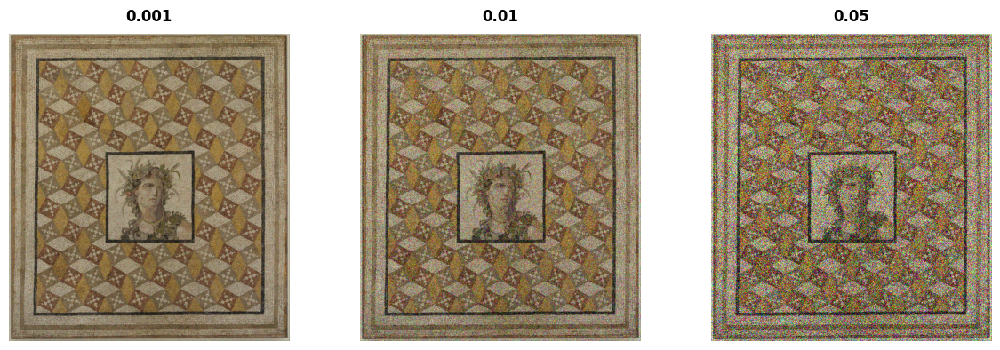

Salt and pepper Noise with different intensities
Displaying 3 images


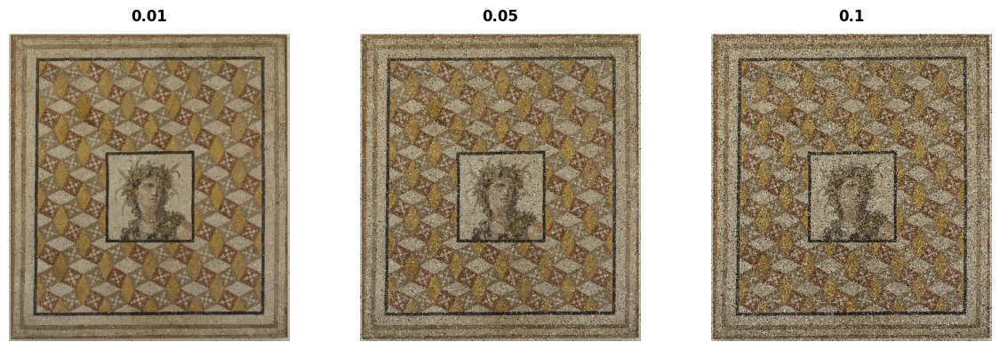

In [ ]:
print("Gaussian Noise with different variance")
display_images_in_row(noisy_mosaic["gaussian"],labels=["0.001","0.01","0.05"])
print("Salt and pepper Noise with different intensities")
display_images_in_row(noisy_mosaic["salt_pepper"], labels=["0.01","0.05","0.1"])



### Implement filters here for all the noise levels

In [ ]:
import numpy as np

def mean_filter(img, kernel_size=3):
    # filtered = img
    # Write your code here
    H, W, C = img.shape
    pad = kernel_size // 2
    filtered = np.zeros(img.shape, dtype=np.float32)

    for c in range(C):
        out = np.zeros((H, W), dtype=np.float32)
        padded_img = np.pad(img[:, :, c], pad, mode='edge')
        for i in range(H):
            for j in range(W):
                out[i, j] = np.mean(padded_img[i:i+kernel_size, j:j+kernel_size])
        filtered[:, :, c] = out
    return filtered

def median_filter(img, kernel_size=3):
    # filtered = img
    # Write your code here
    H, W, C = img.shape
    pad = kernel_size // 2
    filtered = np.zeros(img.shape, dtype=np.float32)

    for c in range(C):
        out = np.zeros((H, W), dtype=np.float32)
        padded_img = np.pad(img[:, :, c], pad, mode='edge')
        for i in range(H):
            for j in range(W):
                out[i, j] = np.median(padded_img[i:i+kernel_size, j:j+kernel_size])
        filtered[:, :, c] = out
    return filtered

def gaussian_filter(img, kernel_size=5, sigma=1.0):
    # filtered = img
    # Write your code here
    H, W, C = img.shape
    pad = kernel_size // 2
    filtered = np.zeros(img.shape, dtype=np.float32)

    # Gaussian kernel
    # 1. Meshgrid Method
    # ax = np.linspace(-(kernel_size // 2), kernel_size // 2, kernel_size)
    # xx, yy = np.meshgrid(ax, ax)
    # kernel = np.exp(-(xx**2 + yy**2) / (2 * sigma**2))
    # 2. Geometric Shift Method
    kernel = np.fromfunction(
        lambda x, y: (1/(2 * np.pi * sigma**2)) * np.exp(- ((x-(kernel_size-1)/2)**2 + (y-(kernel_size-1)/2)**2) / (2 * sigma**2)),
        (kernel_size, kernel_size)
    )

    kernel = kernel / np.sum(kernel)

    for c in range(C):
        out = np.zeros((H, W), dtype=np.float32)
        padded_img = np.pad(img[:, :, c], pad, mode='edge')
        for i in range(H):
            for j in range(W):
                out[i, j] = np.sum(padded_img[i:i+kernel_size, j:j+kernel_size] * kernel)
        filtered[:, :, c] = out
    return filtered

def bilateral_filter(img, diameter=5, sigma_color=0.2, sigma_space=2.0):
    # filtered = img
    # Write your code here
    H, W, C = img.shape
    pad = diameter // 2
    filtered = np.zeros(img.shape, dtype=np.float32)

    for c in range(C):
        out = np.zeros((H, W), dtype=np.float32)
        padded_img = np.pad(img[:, :, c], pad, mode='edge')

        # Pre-compute spatial Gaussian kernel
        # 1. Meshgrid Method
        # ax = np.linspace(-(diameter // 2), diameter // 2, diameter)
        # xx, yy = np.meshgrid(ax, ax)
        # spatial_kernel = np.exp(-(xx**2 + yy**2) / (2 * sigma_space**2))
        # 2. Geometric Shift Method
        spatial_kernel = np.fromfunction(
            lambda x, y: (1/(2 * np.pi * sigma_space**2)) * np.exp(- ((x-(diameter-1)/2)**2 + (y-(diameter-1)/2)**2) / (2 * sigma_space**2)),
            (diameter, diameter)
        )

        for i in range(H):
            for j in range(W):
                center_pixel_intensity = padded_img[i+pad, j+pad]
                region = padded_img[i:i+diameter, j:j+diameter]
                intensity_diff = region - center_pixel_intensity
                intensity_kernel = np.exp(-(intensity_diff**2) / (2 * sigma_color**2))

                bilateral_kernel = spatial_kernel * intensity_kernel
                bilateral_kernel /= np.sum(bilateral_kernel)

                out[i, j] = np.sum(region * bilateral_kernel)
        filtered[:, :, c] = out

    return filtered

Row 1: gaussian noise (level=0.001)
Displaying 5 images


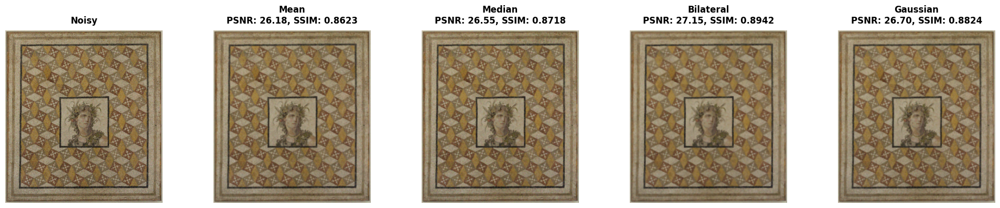

Row 2: gaussian noise (level=0.01)
Displaying 5 images


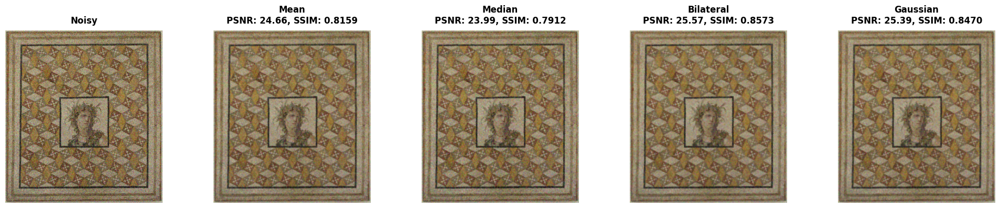

Row 3: gaussian noise (level=0.05)
Displaying 5 images


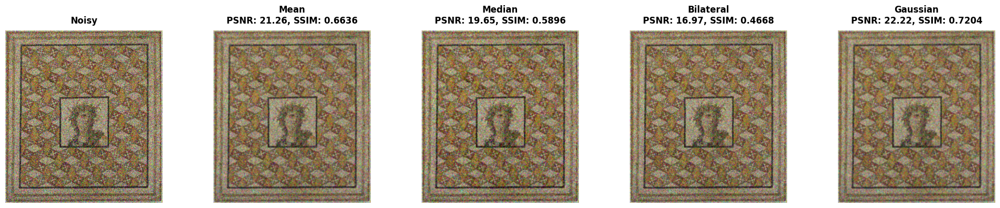

Row 4: salt_pepper noise (level=0.01)
Displaying 5 images


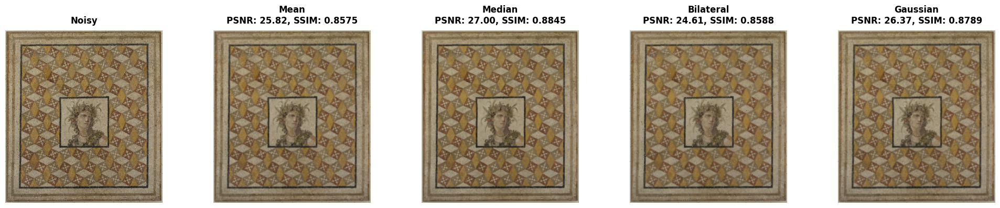

Row 5: salt_pepper noise (level=0.05)
Displaying 5 images


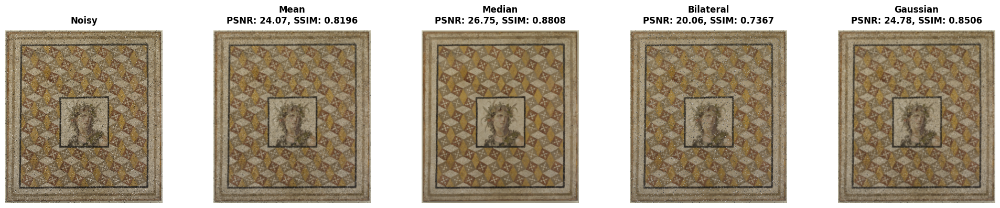

Row 6: salt_pepper noise (level=0.1)
Displaying 5 images


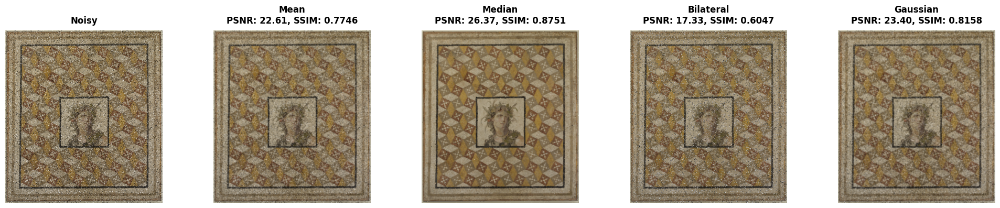

In [ ]:
from skimage.metrics import peak_signal_noise_ratio, structural_similarity

def test_filters_minimal( noisy_versions, filter_functions, filter_names):
    rows = []
    row_info = []  # keep track of (noise_type, param)

    noise_params = [
        ('gaussian', [0.001, 0.01, 0.05]),
        ('salt_pepper', [0.01, 0.05, 0.1])
    ]

    psnr_scores = []
    ssim_scores = []

    for noise_type, params in noise_params:
        for i, param in enumerate(params):
            noisy = noisy_versions[noise_type][i]
            denoised_imgs = [f(noisy) for f in filter_functions]
            row_imgs = [noisy] + denoised_imgs

            # Calculate PSNR and SSIM for each denoised image
            psnr_row = [peak_signal_noise_ratio(mosaic_rgb_rs, img, data_range=1.0) for img in row_imgs]
            ssim_row = [structural_similarity(mosaic_rgb_rs, img, multichannel=True, data_range=1.0, win_size=3) for img in row_imgs]
            psnr_scores.append(psnr_row)
            ssim_scores.append(ssim_row)

            rows.append(row_imgs)
            row_info.append((noise_type, param))

    # Display all rows
    for i, (row_imgs, (noise_type, param)) in enumerate(zip(rows, row_info)):
        print(f"Row {i+1}: {noise_type} noise (level={param})")
        filter_names_with_scores = ["Noisy"] + [f"{name}\nPSNR: {psnr:.2f}, SSIM: {ssim:.4f}" for name, psnr, ssim in zip(filter_names, psnr_scores[i][1:], ssim_scores[i][1:])]
        display_images_in_row(row_imgs, filter_names_with_scores)

    return None

filter_functions = [mean_filter, median_filter, bilateral_filter, gaussian_filter]
filter_names = ['Mean', 'Median', 'Bilateral', 'Gaussian']


test_filters_minimal(noisy_mosaic, filter_functions, filter_names)

# you should find psnr or ssim as well to get a better understanding

📖 Theory Q: Question: Which filtering method works best for gaussian noise and which works for salt and pepper noise? Why?   
Ans:

For Gaussian noise, the Gaussian filter and the Bilateral filter gave similar PSNR and SSIM scores but Gaussian started performing better than the bilateral one as we increased the noise level.  Intuitively, Gaussian noise is zero-mean and spread around each pixel; convolving with a Gaussian kernel performs a weighted local averaging that reduces variance of the noise while preserving low-frequency structure. The mean filter also reduced the noise, but it removed fine facial details because it weighs all neighbours equally. A bilateral filter often gave better visual results near edges because it combines spatial and intensity weighting (so it smooths within regions but preserves edges).

For salt-and-pepper, the median filter worked the best. Salt-and-pepper creates isolated extreme pixels (0 or 1) that are statistical outliers. The median filter ignored these spikes as long as they don’t dominate the window. This helps removing impulses while keeping the edges. The mean and gaussian filters are averaging filters so they try to average in the outliers and are heavily skewed by the outlier values. The bilateral performed the worst with impulse noise because the corrupted pixel’s intensity difference can still attract some weight locally.

### Task 2: Detect the Points of Truth (3 Marks)
Professor Ketu: "Seek geometric truth in the original, not the corrupted version! The curse creates false corners."

Implement Harris Corner Detection on the pristine original image:

Found 4856 corners
Displaying 3 images


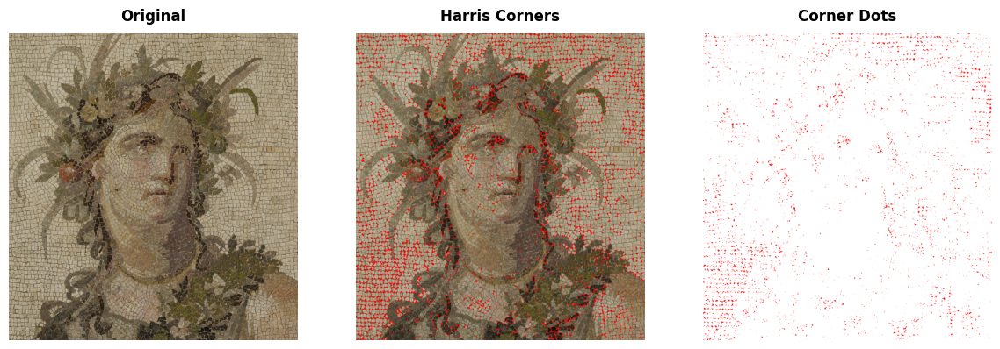

Found 55879 corners
Displaying 3 images


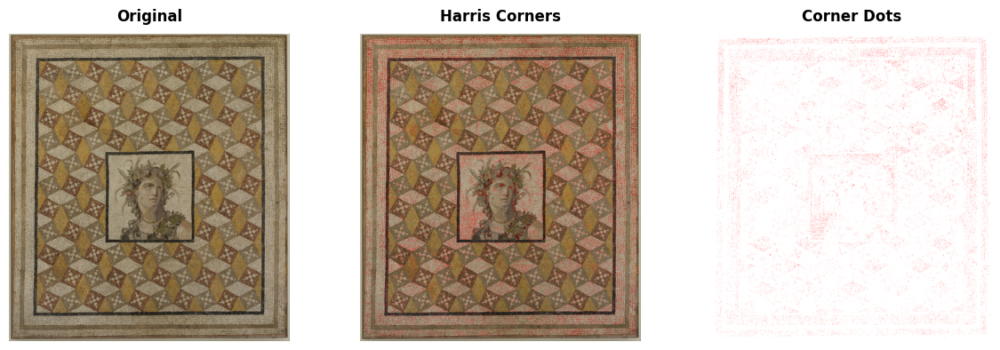

In [ ]:
def detect_harris_corner(image, window_size=3, k=0.04, threshold=0.05, initial_blur=False, apply_nms=True, nms_window=3):

    # Write your code here
    if image.ndim == 3:
        gray = rgb2gray(image)
    else:
        gray = image

    # Initial Gaussian Smoothing
    if initial_blur:
        gray = cv2.GaussianBlur(gray, (window_size, window_size), 1)

    # Compute Gradients using Sobel operator
    Ix = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=3)
    Iy = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=3)

    # Compute products of derivatives
    Ixx = Ix * Ix
    Iyy = Iy * Iy
    Ixy = Ix * Iy

    # Apply Gaussian filter to the products
    Sxx = cv2.GaussianBlur(Ixx, (window_size, window_size), sigmaX=1)
    Syy = cv2.GaussianBlur(Iyy, (window_size, window_size), sigmaX=1)
    Sxy = cv2.GaussianBlur(Ixy, (window_size, window_size), sigmaX=1)

    # Harris response calculation
    det = (Sxx * Syy) - (Sxy ** 2)
    trace = Sxx + Syy
    R = det - k * (trace ** 2)

    # Thresholding on R
    if threshold is None:
        threshold = 0.01 * np.max(R)

    # Non-Maximum Suppression (NMS)
    if apply_nms:
        dilated = cv2.dilate(R, np.ones((nms_window, nms_window), np.uint8))
        nms_mask = (R==dilated) & (R>threshold)
        mask = nms_mask
    else:
        mask = R > threshold

    corners = np.argwhere(mask)
    print(f"Found {len(corners)} corners")
    corner_dots = np.ones_like(image) * 255
    corner_dots[R > threshold] = [255, 0, 0]
    corner_image = image.copy()
    for y, x in corners:
        cv2.circle(corner_image, (x, y), 2, (255, 0, 0), -1)

    return corner_image, corners, corner_dots


key_harris , key_corners, key_corner_dots = detect_harris_corner(key_rgb)
display_images_in_row([key_rgb,key_harris,key_corner_dots], labels=["Original","Harris Corners","Corner Dots"])

mosaic_harris , mosaic_corners, mosaic_corner_dots = detect_harris_corner(mosaic_rgb)
display_images_in_row([mosaic_rgb,mosaic_harris,mosaic_corner_dots], labels=["Original","Harris Corners","Corner Dots"])

📖 Theory Q: What mathematical property of the Harris matrix allows it to distinguish between edges and corners?  
Ans.

Harris Corner Detector uses the second-moment (structure) matrix $M$ built from local gradient products $I_x, I_y$:  

$$
M = \begin{pmatrix}
\sum I_x^2 & \sum I_x I_y \\
\sum I_x I_y & \sum I_y^2
\end{pmatrix}
$$


The eigenvalues $\lambda_1, \lambda_2$ of $M$ show us how gradient energy spreads in two orthogonal directions.

- If both $\lambda_1$ and $\lambda_2$ are small $\implies$ almost no gradient $\implies$ patch is **flat** (no structure).  
- If one eigenvalue is large and the other small ($\lambda_1 \gg \lambda_2$) $\implies$ strong variation in one direction $\implies$ **edge**.  
- If both eigenvalues are large $\implies$ strong variation in two perpendicular directions $\implies$ **corner**.

The determinant $(λ1 * λ2)$ and trace $(λ1+λ2)$ combine into the Harris response $R$.
$$
R = \det(M) - k \cdot (\mathrm{trace}(M))^2 = \lambda_1 \lambda_2 - k(\lambda_1 + \lambda_2)^2
$$
where k usually lies between 0.04 and 0.06.

$R$ is high only when both eigenvalues are large (so determinant is large) and not dominated by just one eigenvalue (since $trace^2$ term penalizes the single‑eigenvalue case).

Intuitively, corners produce significant intensity changes in two perpendicular directions. This is the result of large, balanced eigenvalues of the Harris matrix. This is the mathematical property that lets the Harris corner detector separate corners from edges and flat zones.


### Task 3: Find the Hidden Philosopher (3 Marks)
Professor Ketu: "Combine my teachings! Let the original guide your search, let clarity reveal the details."

Implement feature matching to find the philoshopher in the mosaic, you can use SSD (Sum of squared differences):

Hint:How can you describe small patches around keypoints in both images?  
 How do you measure similarity between descriptors?

In [ ]:
from tqdm import tqdm

def extract_descriptors(img, corners, patch_size=15):

    descriptors, valid_points = [], []
    # Write your code here
    if img.ndim == 3:
        gray = rgb2gray(img)
    else:
        gray = img

    H, W = gray.shape
    pad = patch_size // 2
    for y, x in corners:
        # Check if the patch is within the image boundaries
        if y-pad>=0 and y+pad<H and x-pad>=0 and x+pad<W:
            patch = gray[y-pad : y+pad+1, x-pad : x+pad+1]
            desc = patch.flatten()  # Flatten the patch into a 1D vector
            desc = (desc-np.mean(desc)) / (np.std(desc)+1e-10)  # Normalize the descriptor
            descriptors.append(desc)
            valid_points.append((y, x))
    return np.array(valid_points), np.array(descriptors)

def match_features(desc1, desc2, pts1, pts2, ratio=0.7):
    matches = []
    # Write your code here
    for i in tqdm(range(len(desc1)), desc="Matching features"):
        d1 = desc1[i]
        # SSD Distance
        distances = np.linalg.norm(desc2 - d1, axis=1)
        # distances = np.sum((desc2 - d1)**2, axis=1)
        if len(distances) < 2:
            continue
        sorted_indices = np.argsort(distances)
        best_idx = sorted_indices[0]
        second_best_idx = sorted_indices[1]

        # Lowe's Ratio Test
        if distances[best_idx] < ratio*distances[second_best_idx]:
            matches.append((pts1[i], pts2[best_idx]))
    return matches


pts_mosaic, desc_mosaic = extract_descriptors(mosaic_rgb, mosaic_corners)
print(f"Extracted {len(desc_mosaic)} descriptors from mosaic")

pts_key, desc_key = extract_descriptors(key_rgb, key_corners)
print(f"Extracted {len(desc_key)} descriptors from key fragment")

Extracted 55878 descriptors from mosaic
Extracted 4661 descriptors from key fragment


Matching features: 100%|██████████| 4661/4661 [07:16<00:00, 10.68it/s]


[(array([  7, 231]), array([1528, 1519])), (array([  7, 574]), array([1528, 1862])), (array([  7, 578]), array([1528, 1866])), (array([  8, 184]), array([1529, 1472])), (array([  8, 209]), array([1529, 1497])), (array([  8, 263]), array([1529, 1551])), (array([  8, 588]), array([1529, 1876])), (array([  8, 708]), array([1529, 1996])), (array([  9, 152]), array([1530, 1440])), (array([  9, 206]), array([1530, 1494])), (array([  9, 383]), array([1530, 1671])), (array([  9, 599]), array([1530, 1887])), (array([  9, 603]), array([1530, 1891])), (array([ 10, 130]), array([1531, 1418])), (array([ 10, 145]), array([1531, 1433])), (array([ 10, 156]), array([1531, 1444])), (array([ 10, 175]), array([1531, 1463])), (array([ 10, 211]), array([1531, 1499])), (array([ 10, 260]), array([1531, 1548])), (array([ 10, 273]), array([1531, 1561])), (array([ 10, 277]), array([1531, 1565])), (array([11,  9]), array([1532, 1297])), (array([11, 38]), array([1532, 1326])), (array([ 11, 123]), array([1532, 1411

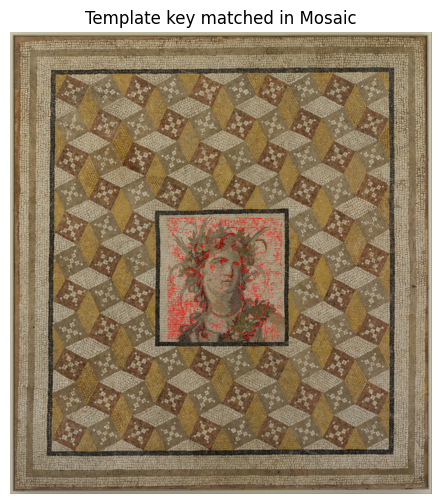

In [ ]:
matches = match_features(desc_key, desc_mosaic, pts_key, pts_mosaic)

print(matches)
print(f"Total matches found: {len(matches)} / {len(pts_key)} keypoints")
mosaic_vis = mosaic_rgb.copy()
for (y1, x1), (y2, x2) in matches:
    cv2.circle(mosaic_vis, (x2, y2), 5, (255, 0, 0), 1)

plt.figure(figsize=(10, 6))
plt.imshow(mosaic_vis)
plt.title("Template key matched in Mosaic")
plt.axis("off")
plt.show()

📖 Theory Q: What are potential weaknesses of SSD-based matching compared to modern descriptors like SIFT/ORB?  
Ans.

SSD (sum-of-squared-differences) on raw intensity patches is a simple and intuitive method for matching features but weak compared to SIFT (Scale-Invariant Feature Transform) and ORB (Oriented FAST and Rotated BRIEF).

1. Scale and rotation invariant: If the philosopher’s face appears a bit scaled or rotated, plain patches no longer align and this increases the SSD score and leads to a failed match even if the feature is correct. SIFT builds scale‑space keypoints and rotates descriptors to a dominant orientation. ORB handles orientation and uses binary tests. This makes SIFT and ORB rotation and scale invariant.

2. Sensitive to illumination: A slight brightness or contrast shift between the key patch and the mosaic region can increase SSD even if the structure matches. SIFT uses gradient orientations and normalize histograms and ORB uses binary tests that make them more lighting invariant.

3. Noise invariant: If we add noise, many pixel intensities change directly, and the SSD distances grow. Gradient/histogram or binary comparison descriptors are more stable to this.

4. Curse of Dimensionality: A raw 15×15 patch gives 225 float values. Distance over lots of keypoints is more expensive than comparing short binary ORB descriptors with Hamming distance.

So, SSD on raw patches works as a simple baseline but it is invariant to geometric and photometric transformations and this is where SIFT and ORB prove to be better than SSD.
